<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
%load_ext autoreload
%autoreload 2

In [53]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
from numpy import linalg as ln
import IPython
from scipy import linalg as la
from scipy import fftpack
from scipy import signal
import time
from imageio import imread

In [3]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [65]:
class SoundWave(object):
    """A class for working with digital audio signals."""


    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples


    def plot(self, dftPlot=False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        if dftPlot:
            # get the dft
            dft = fftpack.fft(self.samples)
            k = np.arange(len(dft) // 2)
            
            # find the frequency
            freq = k * self.rate / len(self.samples)
            
            # plot the sound wave
            plt.plot(freq, np.abs(dft[:len(dft) // 2]))
            plt.xlim((0,max(freq)))
            plt.title("Frequencies")
            plt.xlabel("Frequency")
            plt.ylabel("Count")
        
        else:
            # plot the sound wave
            plt.plot(self.samples)
            plt.ylim((-32768, 32767))
            plt.title(f"Sound Wave {np.argmax(np.abs(dft[:len(dft) // 2]))}")
            plt.ylabel("Samples")
            plt.xlabel("Time (Seconds)")
        
        plt.show()


    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.
        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        # get the real values
        data = self.samples.real
        
        # scale data if necessary
        if force or data.dtype != np.int16:
            scaled = np.int16(data / max(data) * 32767)
        
        else:
            scaled = data
        
        # write the wavfile
        wavfile.write(filename, rate, scaled)
    

    def __add__(self, other):
        """Combine the samples from two SoundWave objects.
        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.
        Raises:
            ValueError: if the two sample arrays are not the same length.
        """

        # return the sum of the samples
        if len(self.samples) != len(other.samples):
            raise ValueError("Samples do not have the same length")
        
        return SoundWave(self.rate, self.samples + other.samples)


    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.
        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.
        Raises:
            ValueError: if the two sample rates are not equal.
        """

        # return the combined sound wave
        if self.rate != other.rate:
            raise ValueError("Samples do not have the same rate")
        
        return SoundWave(self.rate, np.concatenate((self.samples, other.samples)))
    
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.
        Raises:
            ValueError: if the two sample rates are not equal.
        """
        
        # raise a value error if the two sample rates are not equal
        if self.rate != other.rate:
            raise ValueError("SoundWaves do not have the same sample rate")
        
        # set local variables
        f = self.samples
        g = other.samples
        dif = np.abs(f.size - g.size)
        
        # pad shorter sample array with zeros
        if len(f) < len(g):
            f = np.pad(f, dif)[dif:]
        
        else:
            g = np.pad(g, dif)[dif:]
        
        # return a new SoundWave object determined by the convolution of the two samples
        return SoundWave(self.rate, fftpack.ifft(np.multiply(fftpack.fft(f), fftpack.fft(g))))


    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.
        Raises:
            ValueError: if the two sample rates are not equal.
        """
        
        # raise a value error if the two sample rates are not equal
        if self.rate != other.rate:
            raise ValueError("SoundWaves do not have the same sample rate")
        
        # set local variables
        f = self.samples
        g = other.samples
        n = len(f)
        m = len(g)
        
        # find the power of 2 greater than both sample lengths
        a = 0
        while 2**a < n+m-1:
            a += 1
        
        # pad both sample arrays with zeros
        f = np.pad(f, 2**a - n)
        g = np.pad(g, 2**a - m)
        
        # perform linear convolution
        conv = fftpack.ifft(np.multiply(fftpack.fft(f), fftpack.fft(g)))
        
        # return a new soundwave object based on the linear convolution of the samples
        return SoundWave(self.rate, conv[:(n+m-1)])



    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        
        # set local variables
        f = self.samples
        n = len(self.samples)
        r = self.rate
        c = fftpack.fft(f)
        
        # find klow and khigh
        klow = int(low_freq * n / r)
        khigh = int(high_freq * n / r)
        
        # set the given ranges to zero
        c[klow:khigh+1] = np.zeros(khigh-klow+1)
        c[n-khigh:n-klow+1] = np.zeros(khigh-klow+1)
        # update self.samples
        self.samples = fftpack.ifft(c)

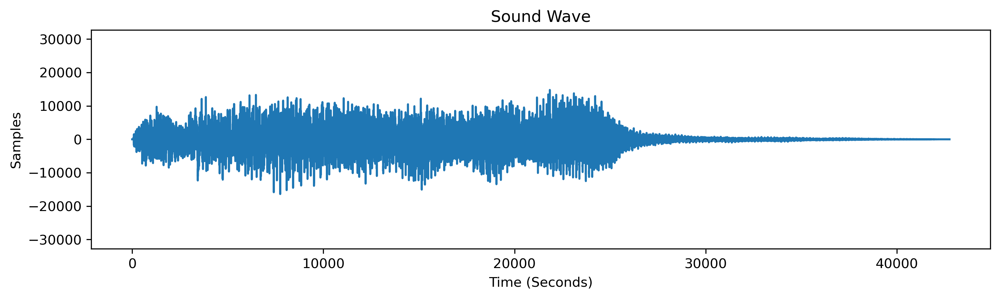

In [4]:
# read sound wave and plot it
rate, data = wavfile.read("tada.wav")
wave = SoundWave(rate, data)
wave.plot()

In [6]:
# display tada file
IPython.display.Audio("tada.wav")

In [7]:
# build original file and disply it
wave.export("original_file.wav")
IPython.display.Audio("original_file.wav")

In [8]:
# build scaled file and display it
wave.export("scaled_file.wav", True)
IPython.display.Audio("scaled_file.wav")

In [9]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    
    # set rate
    rate = 44100
    
    # set sample
    x = np.linspace(0, duration, int(rate * duration))
    
    # get wave values and return SoundWave object
    samples = np.sin(2 * np.pi * x * frequency)
    
    return SoundWave(rate, samples)

In [22]:
# generate note and export it
note = generate_note(440, 3)
note.export("prob3.wav")

In [23]:
IPython.display.Audio("prob3.wav")

In [12]:
# generate A, C, and E
A = generate_note(440, 3)
C = generate_note(523.25, 3)
E = generate_note(659.25, 3)

# build chord and display it
chord = A + C + E
IPython.display.Audio(rate=chord.rate, data=chord.samples)

In [13]:
# generate A, C, and E notes
A = generate_note(440, 1)
C = generate_note(523.25, 1)
E = generate_note(659.25, 1)

# build progression
arpeggio = A >> C >> E
IPython.display.Audio(rate=arpeggio.rate, data=arpeggio.samples)

In [14]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.
    Parameters:
        samples ((n,) ndarray): an array of samples.
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """

    # get length
    n = len(samples)

    # build m array
    m = np.arange(n).reshape(n, 1)
    
    # build W matrix
    W = np.exp((-2j * np.pi / n) * m @ m.T)

    return W @ samples / n

In [15]:
# test simple_dft method
a = np.random.rand(20)
np.allclose(np.real(len(a) * simple_dft(a)), np.real(fftpack.fft(a)))

True

In [16]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """

    # split helper function
    def split(g):

        # get length and check threshold
        n = len(g)
        if n <= threshold:
            return n * simple_dft(g)
        
        else:
            # build even and odd DFT objects
            even = split(g[::2])
            odd = split(g[1::2])

            # initialize z array with omega values
            z = np.zeros(n, dtype=complex)
            for k in range(n):
                z[k] = np.exp(-2j * np.pi * k / n)

            m = n // 2

            # return the concatenated array
            return np.concatenate((even + np.multiply(z[:m], odd), even + np.multiply(z[m:], odd)))
        
    return split(samples) / len(samples)

In [17]:
# time dft
a = np.random.rand(8192)
start = time.perf_counter()

simple_dft(a)
dft = time.perf_counter()

# time my fft
b = np.real(len(a) * simple_fft(a))
simple = time.perf_counter()

# time scipy fft
c = np.real(fftpack.fft(a))
fft = time.perf_counter()

print("DFT:", dft - start)
print("My FFT:", simple - dft)
print("FFT:", fft - simple)

np.allclose(b / max(b), c / max(c))

DFT: 11.3629513
My FFT: 0.3421573000000002
FFT: 0.007318500000000228


True

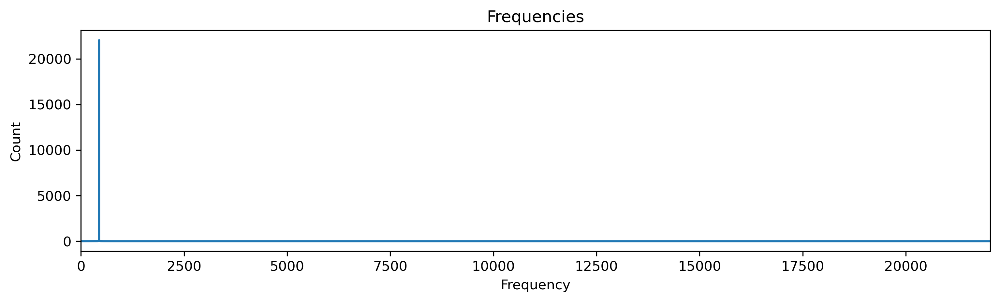

In [18]:
# plot A to test problem 7
A.plot(True)

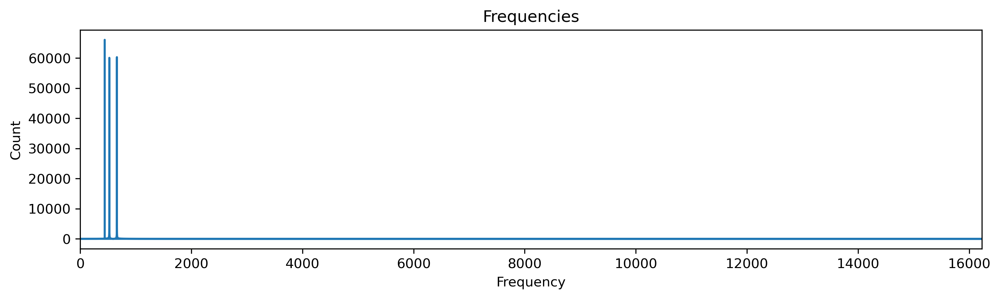

In [19]:
# plot chord to test problem 7
chord.plot(True)

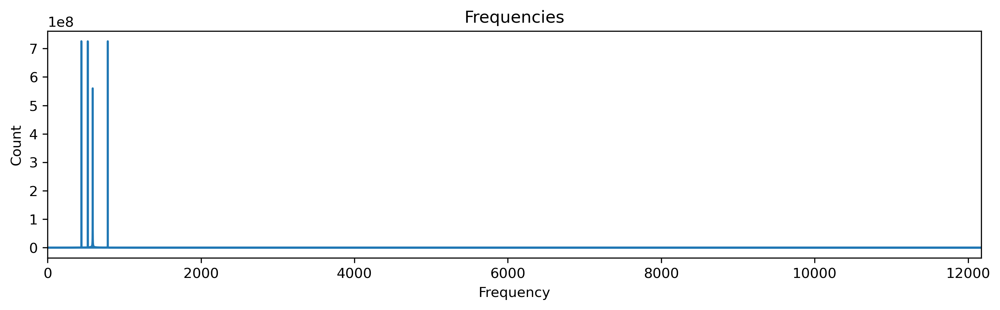

Frequency: [587.5, 523.25, 784.0, 440.0]
These notes are D, C, G, A


In [20]:
# get mystery chord
rate, data = wavfile.read("mystery_chord.wav")
mystery = SoundWave(rate, data)
mystery.plot(True)

# compute dft
dft = fftpack.fft(mystery.samples)
k = np.arange(len(dft) // 2)

# get indexes of max values
inds = np.argsort(np.abs(dft[:len(dft) // 2]))[-4:]

# get length of the samples and find frequency
n = len(mystery.samples)
freq = [mystery.rate * k / n for k in range(0,n)]
notes = []

# select frequencies correstponding to indexs
for i in inds:
    notes.append(freq[i])
    
# print notes
print("Frequency:", notes)
print("These notes are D, C, G, A")

<h2 align="center">Part 2: Convolution and Filtering.</h2>

In [66]:
rate, data = wavfile.read("tada.wav") # Create 2 seconds of white noise at a given rate.
white_noise = np.random.randint(-32767, 32767, rate*2, dtype=np.int16)

# convolve the whitenoise with the tada sound
conv = SoundWave(rate, data) * SoundWave(rate, white_noise)
conv = conv >> conv

In [67]:
# display convolved audio file
IPython.display.Audio(rate=conv.rate, data=conv.samples)

In [68]:
# read in notes and construct SoundWave objects
rateC, CGC = wavfile.read("CGC.wav")
rateG, GCG = wavfile.read("GCG.wav")
Cwave = SoundWave(rateC, CGC)
Gwave = SoundWave(rateG, GCG)

# time my implementation versus the scipy implementation
start = time.perf_counter()
power = Cwave ** Gwave
pause = time.perf_counter()
sciPower = signal.fftconvolve(CGC, GCG)
end = time.perf_counter()

# display results
print(f"My implementation took {round(pause - start, 5)} seconds.")
print(f"Scipy implementation took {round(end - pause, 5)} seconds.")

My implementation took 1.02432 seconds.
Scipy implementation took 0.02839 seconds.


In [69]:
# display CGC sound
IPython.display.Audio(rate=Cwave.rate, data=Cwave.samples)

In [70]:
# display GCG sound
IPython.display.Audio(rate=Gwave.rate, data=Gwave.samples)

In [71]:
# display my power sound
IPython.display.Audio(rate=power.rate, data=power.samples)

In [72]:
# display scipy power sound
IPython.display.Audio(rate=power.rate, data=sciPower)

In [73]:
# read in sound files and create SoundWave objects
rateC, chopin = wavfile.read("chopin.wav")
rateB, balloon = wavfile.read("balloon.wav")
ChopWave = SoundWave(rateC, chopin)
BallWave = SoundWave(rateB, balloon)

# create new SoundWave object by convolving the two sound files
ChopBalloon = SoundWave(rateC, signal.fftconvolve(chopin, balloon))

In [74]:
# display chopin sound
IPython.display.Audio("chopin.wav")

In [75]:
# display balloon sound
IPython.display.Audio("balloon.wav")

In [76]:
# display convolved sound
IPython.display.Audio(rate=ChopBalloon.rate, data=ChopBalloon.samples)

In [77]:
# read in sound files and create soundwave objects
rate1, samples1 = wavfile.read("noisy1.wav")
noisy1 = SoundWave(rate1, samples1)
rate2, samples2 = wavfile.read("noisy2.wav")
noisy2 = SoundWave(rate2, samples2)

In [78]:
# display noisy1 sound
IPython.display.Audio(rate=noisy1.rate, data=noisy1.samples)

In [79]:
# clean noisy1
noisy1.clean(1250, 2600)

In [80]:
# display clean noisy1 sound
IPython.display.Audio(rate=noisy1.rate, data=noisy1.samples)

In [81]:
# clean noisy 2 sound
noisy2.clean(1250, 4600)

In [82]:
# display clean noisy2 sound
IPython.display.Audio(rate=noisy2.rate, data=noisy2.samples)

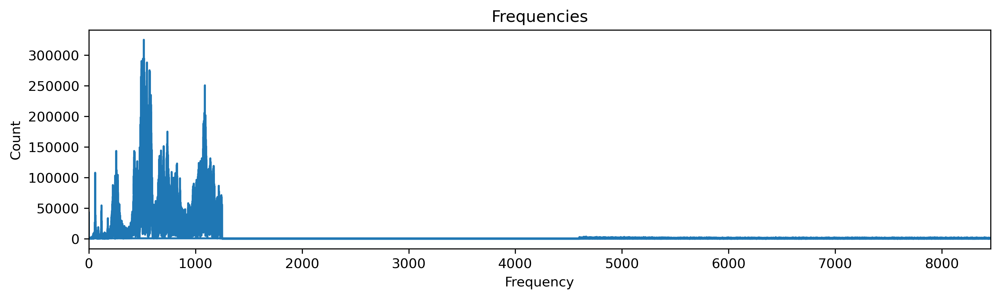

In [83]:
# plot dft of noisy2 to find bad frequencies
noisy2.plot(True)

In [84]:
# read sound file and create SoundWave objects
rate, samples = wavfile.read("vuvuzela.wav")
vuv1 = SoundWave(rate, samples[:,0])
vuv2 = SoundWave(rate, samples[:,1])

In [85]:
# clean Soundwave objects
vuv1.clean(200,500)
vuv2.clean(200,500)

# recounstruct sound file
vuv = SoundWave(vuv1.rate, np.vstack((vuv1.samples, vuv2.samples)))

In [86]:
# display full cleaned sound
IPython.display.Audio(rate=vuv.rate, data=vuv.samples)

C:\Users\dalli\anaconda3\lib\site-packages\IPython\lib\display.py:159: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


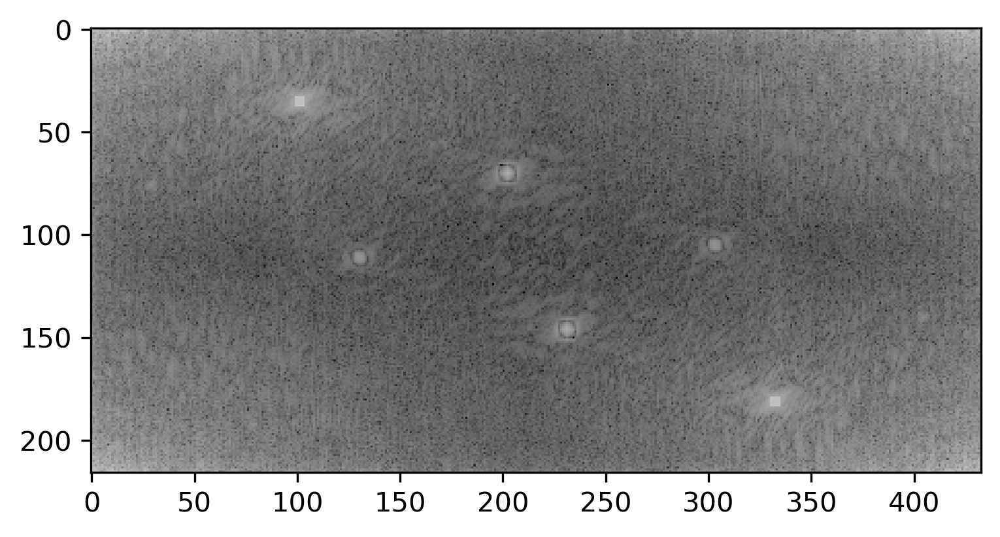

In [87]:
# read in image and create dft
image = imread("license_plate.png") / 255.
dft = fftpack.fft2(image)

# plot dft of the image
plt.imshow(np.log(np.abs(dft)), cmap="gray")

# clean problem spots
mean = np.mean(dft)
dft[65:75,199:209] = mean
dft[142:150,226:236] = mean
dft[108:118,125:135] = mean
dft[33:38,99:104] = mean
dft[176:186,330:340] = mean

# update image
image = fftpack.ifft2(dft).real

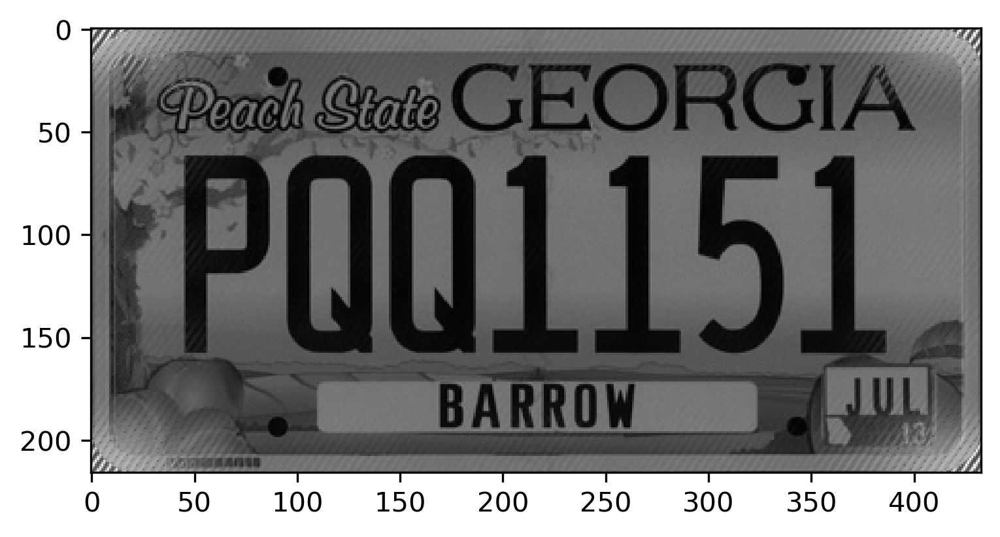

In [88]:
# display cleaned image
plt.imshow(image, cmap="gray")

The year on the sticker is...13!